# Fig. 4 RETrace2 methylation pipeline infers cell type with minimal number of CpGs.
- Single cell test samples are randomly selected from Liu et al. 2023 and preprocessed by intersecting with retrace2 pseudobulk data
- Reference cell type pseudobulk data from Liu et al.2023 are processed by aggregating single cell samples and intersecting with ChromHMM mTSS, mEnhA, mEnhWk, mBivProm states regions
- Pariwise dissimilarity matrix is calculated by running */RETrace2/modules/infer_celltype/calculate_pd_matrix_batched.py*


In [1]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import re

In [2]:
# Load pairwise dissimilarity matrix
pd_matrix_file = '/home/tcheng/Projects/RETrace/Methylation_ref/Test_data/Liu2023_Brain/2_calc_pd_matrix/test_pd_matrix_intersect_retrace2_ChromHMM_mTSS_mEnhA_mEnhWk_mBivProm_5cells/pairwise_dissimilarity_matrix.csv'
pd_matrix = pd.read_csv(pd_matrix_file, index_col=0)

# Split by downsample size

In [3]:
patterns = ['100', '300', '500', '1000', '3000', '5000', '10000', '30000']
split_dfs = {}

for pattern in patterns:
    mask = pd_matrix.index.str.contains(f'_{pattern}\\b', case=False) # use word boundary to ensure exact match
    split_dfs[pattern] = pd_matrix[mask]


# Convert GSM ID to cell type name

In [4]:
metadata = pd.read_csv('/home/tcheng/Projects/RETrace/Methylation_ref/Liu2023_Brain_processing/0_Download/merged_metadata.csv', index_col=0)
metadata.head()

,cell,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,...,Sample_data_row_count,Sample_instrument_model,Sample_library_selection,Sample_library_source,Sample_library_strategy,Sample_relation,Sample_supplementary_file_1,"""ID_REF""",geo_series,Sample_supplementary_file_2
Sample_geo_accession,,,,,,,,,,,,,,,,,,,,,
GSM6574626,10A_M_1,0.008874,0.819390,0.036336,1073981.0,RSP-4,CEMBA190423_10A_1,0,1,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574626,GSE213221,NaN
GSM6574627,10A_M_100,0.007105,0.762382,0.019705,1108484.0,RSP-4,CEMBA190423_10A_2,0,3,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574627,GSE213221,NaN
GSM6574628,10A_M_1000,0.006450,0.744689,0.016373,1443814.0,RSP-4,CEMBA190423_10A_4,7,5,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574628,GSE213221,NaN
GSM6574629,10A_M_1001,0.007433,0.780743,0.029361,1372174.0,RSP-4,CEMBA190423_10A_3,8,4,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574629,GSE213221,NaN
GSM6574630,10A_M_1002,0.006215,0.741165,0.018129,1650777.0,RSP-4,CEMBA190423_10A_3,8,5,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574630,GSE213221,NaN


In [5]:
def rename_index_with_metadata(df, metadata):
    """
    Rename DataFrame index based on GSM IDs and metadata cell types.
    """
    # Create a copy to avoid modifying original
    df_renamed = df.copy()
    
    # Dictionary to count occurrences of each cell type
    celltype_counts = defaultdict(int)
    new_rownames = []
    
    for old_name in df_renamed.index:
        # Extract GSM ID
        gsm_match = re.search(r'(GSM\d+)', old_name)
        
        if gsm_match:
            gsm_id = gsm_match.group(1)
            # Get suffix (everything after GSM ID)
            suffix = old_name.replace(gsm_id, '')
            
            # Map to cell type
            if gsm_id in metadata.index:
                cell_type = metadata.loc[gsm_id, 'Class'].replace(' ', '-')
                celltype_counts[cell_type] += 1
                count = celltype_counts[cell_type]
                
                # Create new name
                new_name = f"{cell_type}_SC{count}{suffix}"
                new_rownames.append(new_name)
            else:
                new_rownames.append(old_name)  # Keep original if not found
        else:
            new_rownames.append(old_name)  # Keep original if no GSM found
    
    # Update the dataframe index
    df_renamed.index = new_rownames
    
    return df_renamed.sort_index()

In [6]:
# Apply to all split DataFrames
split_dfs_renamed = {}
for k_value, sub_df in split_dfs.items():
    split_dfs_renamed[k_value] = rename_index_with_metadata(sub_df, metadata)

# Plot heatmap (Raw pd score)

In [7]:
# Select the brain reference 1-24 columns 
for n_cpg, df in split_dfs_renamed.items():
    split_dfs_renamed[n_cpg] = df.iloc[:, :24]

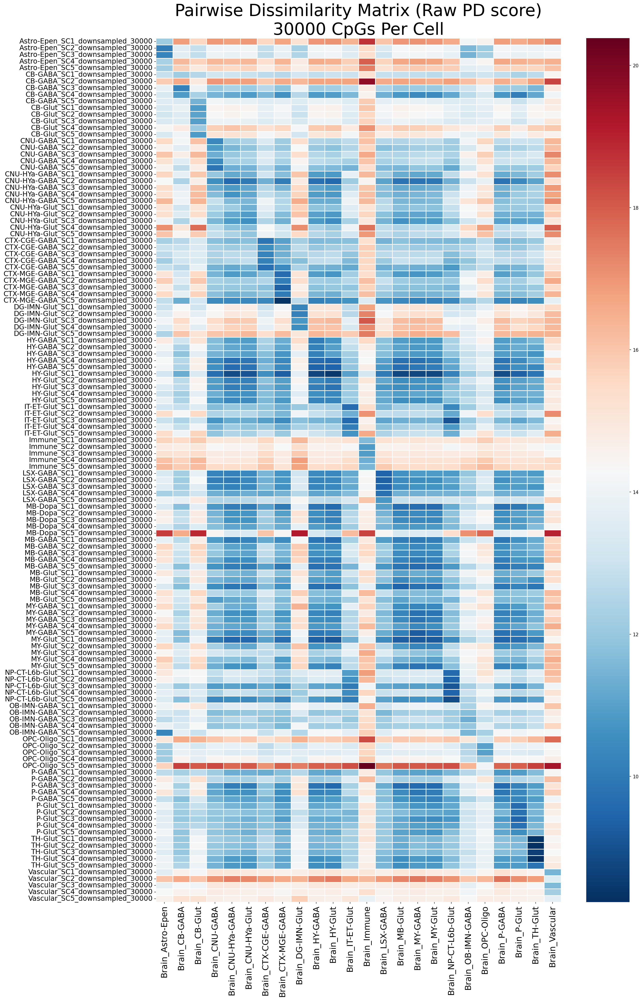

In [8]:
# Plot heatmaps 
n_cpg = '30000'

plt.figure(figsize=(20, 30), dpi=150)
sns.heatmap(split_dfs_renamed[n_cpg], cmap='RdBu_r', linewidths=0.5, yticklabels=True)
plt.title(f'Pairwise Dissimilarity Matrix (Raw PD score)\n{n_cpg} CpGs Per Cell', fontsize=36)

plt.xticks(fontsize=18)
plt.yticks(fontsize=15)
plt.tight_layout()

# Plot Z-score (Row) heatmaps 

In [9]:
# Apply z-score transform to all split DataFrames
split_dfs_renamed_zscore = {}
for k_value, sub_df in split_dfs_renamed.items():
    split_dfs_renamed_zscore[k_value] = sub_df.sub(sub_df.mean(axis=1), axis=0).div(sub_df.std(axis=1), axis=0)

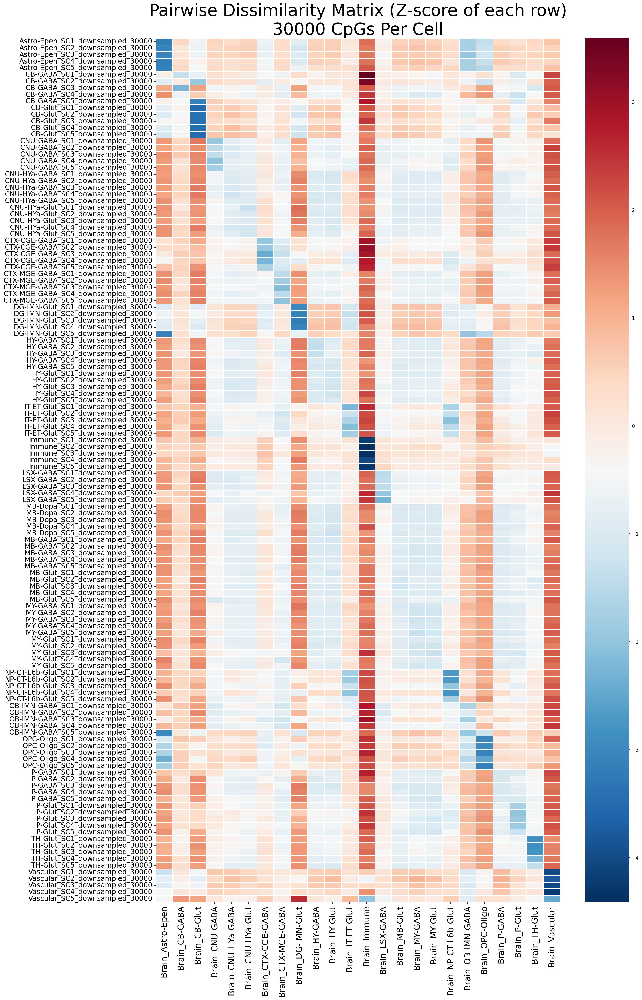

In [10]:
# Plot heatmaps 
n_cpg = '30000'

plt.figure(figsize=(20, 30), dpi=150)

sns.heatmap(split_dfs_renamed_zscore[n_cpg], cmap='RdBu_r', linewidths=0.5, yticklabels=True)
plt.title(f'Pairwise Dissimilarity Matrix (Z-score of each row)\n{n_cpg} CpGs Per Cell', fontsize=36)

plt.xticks(fontsize=18)
plt.yticks(fontsize=15)
plt.tight_layout()

In [11]:
# we want to standardize the color scale for all heatmap subplots for more accurate comparison
print(split_dfs_renamed_zscore['30000'].max().max())
print(split_dfs_renamed_zscore['30000'].min().min())

# set vmin and vmax for all heatmap subplots
vmin, vmax = -4, 4

3.589443790772157
-4.412741612765026


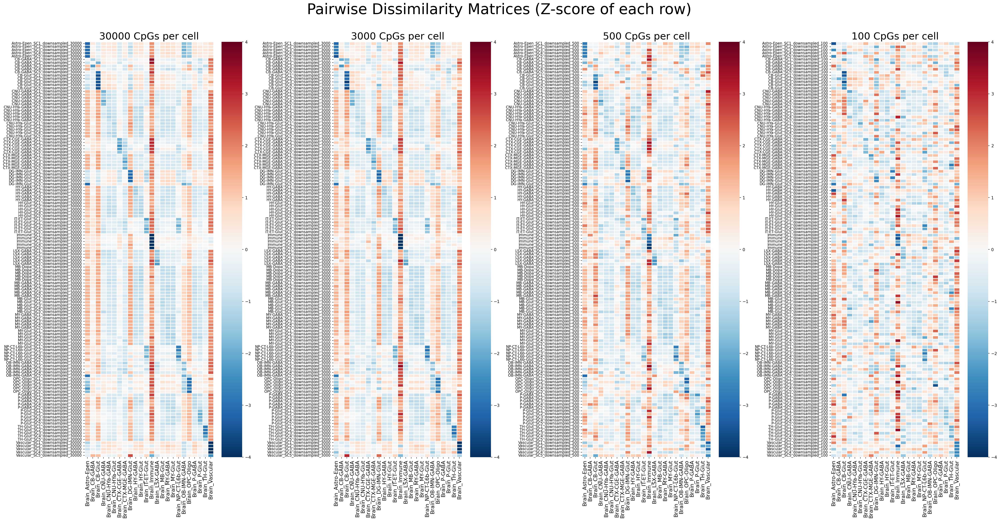

In [12]:
fig, axes = plt.subplots(1, 4, figsize=(34, 18), dpi=150)

# Define the order of your resolutions
resolution_order = ['30000', '3000', '500', '100']

# Plot each DataFrame as a subplot
for i, resolution in enumerate(resolution_order):
    if resolution in split_dfs_renamed_zscore:
        # Select the DataFrame
        df_to_plot = split_dfs_renamed_zscore[resolution]
        
        # Create heatmap on the specific subplot
        sns.heatmap(df_to_plot.iloc[:, :24], 
                   cmap='RdBu_r', 
                   linewidths=0.5, 
                   yticklabels=True,
                   vmin=vmin,
                   vmax=vmax,
                   ax=axes[i])  
        
        # Set title for this subplot
        axes[i].set_title(f'{resolution} CpGs per cell', 
                         fontsize=24)
        
        # Adjust tick sizes
        axes[i].tick_params(axis='x', labelsize=13)
        axes[i].tick_params(axis='y', labelsize=9)

# Add overall title
fig.suptitle(f'Pairwise Dissimilarity Matrices (Z-score of each row)\n', 
             fontsize=36, y=0.98)

plt.tight_layout()
plt.savefig('PD_matrix_zscore_30000_3000_500_100.pdf')
plt.show()

# Caculate Accuracy

In [13]:
def calculate_assignment_accuracy(df_renamed_zscore, zscore_threshold=0):
    
    # Filter out rows with NAs
    initial_rows = len(df_renamed_zscore)
    df_clean = df_renamed_zscore.dropna()
    removed_rows = initial_rows - len(df_clean)

    if removed_rows > 0:
        print(f"Removed {removed_rows} samples with NAs")

    assignment_df = pd.DataFrame({
        'assigned_celltype': df_clean.idxmin(axis=1),
        'min_z_score': df_clean.min(axis=1)
    })

    # remove suffix
    assignment_df['sc_celltype'] = [sc.split('_')[0] for sc in assignment_df.index]
    
    # remove prefix organ name
    assignment_df['assigned_celltype_short'] = [sc.split('_')[1] for sc in assignment_df['assigned_celltype']]

    # Assign match: True/False for threshold-passing rows, NaN otherwise
    assignment_df['match'] = assignment_df.apply(
        lambda row: row['sc_celltype'] == row['assigned_celltype_short'] if row['min_z_score'] < zscore_threshold else np.nan,
        axis=1
    )
    
    # Calculate metrics
    total_rows = len(assignment_df)
    not_assigned = assignment_df['match'].isna().sum()
    assigned = total_rows - not_assigned

    # Accuracy and error for assigned rows
    if assigned > 0:
        assigned_rows = assignment_df[assignment_df['match'].notna()]
        accuracy = assigned_rows['match'].mean() * 100  # % of True among assigned
    else:
        accuracy = 0.0


    # Pass percentage
    pass_percentage = (assigned / total_rows) * 100 if total_rows > 0 else 0.0
    
    return accuracy, pass_percentage, assignment_df

In [14]:
results = []

for n_cpg, df in split_dfs_renamed_zscore.items():
    for zscore_threshold in [0, -0.5, -1, -1.1, -1.2, -1.3, -1.4, -1.5, -1.8, -2]:
    
        accuracy, pass_percentage, assignment_df = calculate_assignment_accuracy(df, zscore_threshold=zscore_threshold)
        
        results.append({
            'n_cpg': n_cpg,
            'accuracy': accuracy,
            'z_score': zscore_threshold,
            'pass_percentage': pass_percentage
        })
            
results_df = pd.DataFrame(results)
results_df.head()

,n_cpg,accuracy,z_score,pass_percentage
0,100,36.923077,0.0,100.000000
1,100,36.923077,-0.5,100.000000
2,100,36.718750,-1.0,98.461538
3,100,37.815126,-1.1,91.538462
4,100,38.938053,-1.2,86.923077


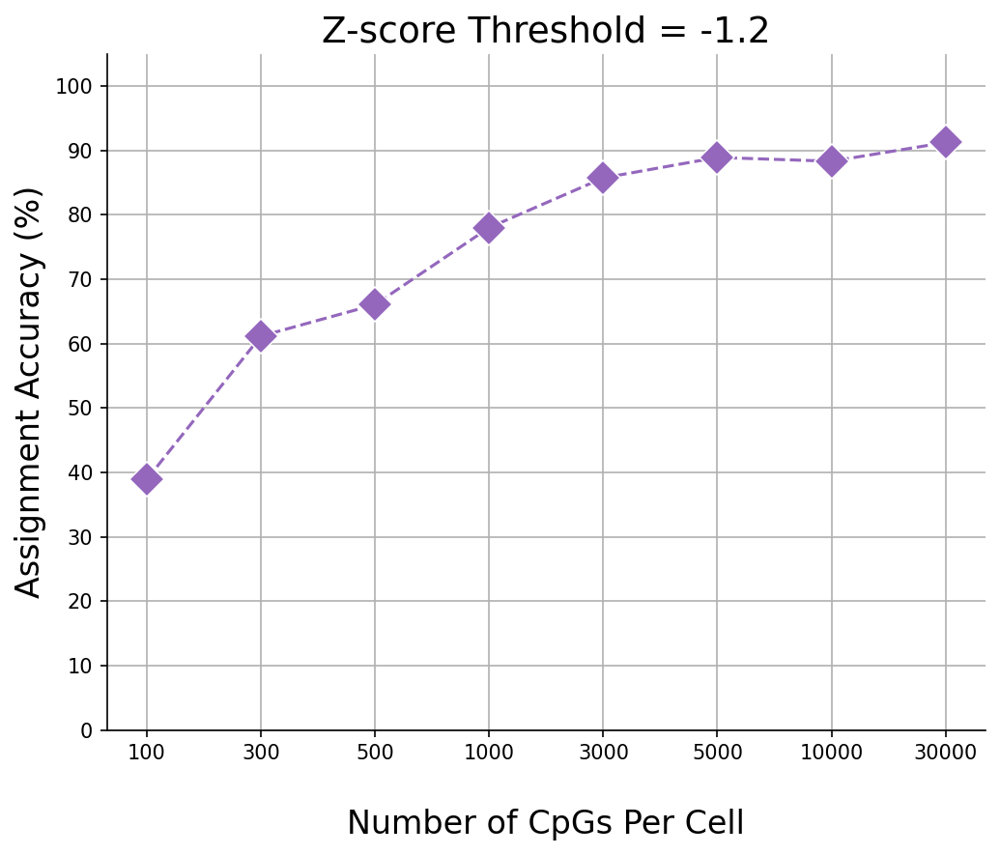

In [15]:
fig, ax = plt.subplots(figsize=(7, 6), dpi=150)

sns.lineplot(
    data=results_df[results_df['z_score'] == -1.2],
    x='n_cpg',
    y='accuracy',
    color='tab:purple',
    marker='D',
    markersize=12,
    linestyle='--',
    ax=ax
)

ax.set_xlabel('\nNumber of CpGs Per Cell', fontsize=16)
ax.set_ylabel('Assignment Accuracy (%)', fontsize=16)
ax.set_title(f'Z-score Threshold = -1.2', fontsize=18)
ax.set_ylim(0, 105)
ax.set_yticks(np.arange(0, 106, 10))
ax.grid(True)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.savefig('Accuracy_vs_nCpG_zscore_threshold_12.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

In [16]:
# look at one example to see the worng assignments
accuracy, pass_percentage, assignment_df = calculate_assignment_accuracy(split_dfs_renamed_zscore['30000'], zscore_threshold=-1.2)
assignment_df.query('match == False')

,assigned_celltype,min_z_score,sc_celltype,assigned_celltype_short,match
CB-GABA_SC2_downsampled_30000,Brain_CB-Glut,-1.884365,CB-GABA,CB-Glut,False
CB-GABA_SC4_downsampled_30000,Brain_P-Glut,-1.270262,CB-GABA,P-Glut,False
CB-GABA_SC5_downsampled_30000,Brain_CB-Glut,-3.124339,CB-GABA,CB-Glut,False
DG-IMN-Glut_SC5_downsampled_30000,Brain_Astro-Epen,-3.113846,DG-IMN-Glut,Astro-Epen,False
IT-ET-Glut_SC2_downsampled_30000,Brain_NP-CT-L6b-Glut,-1.377907,IT-ET-Glut,NP-CT-L6b-Glut,False
IT-ET-Glut_SC3_downsampled_30000,Brain_NP-CT-L6b-Glut,-2.041065,IT-ET-Glut,NP-CT-L6b-Glut,False
MB-Dopa_SC5_downsampled_30000,Brain_HY-Glut,-1.285107,MB-Dopa,HY-Glut,False
OB-IMN-GABA_SC5_downsampled_30000,Brain_Astro-Epen,-2.986187,OB-IMN-GABA,Astro-Epen,False


/tmp/ipykernel_15023/2734582896.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(accuracy_by_celltype.index, rotation=55, ha='right', fontsize=14)


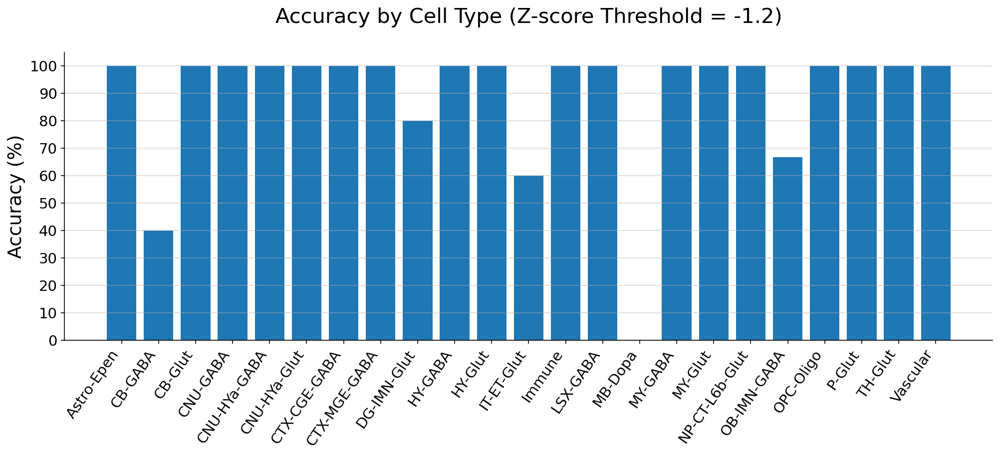

In [17]:
# calculate accuracy by cell type, drop na
accuracy_by_celltype = assignment_df.dropna().groupby('sc_celltype')['match'].mean() * 100

fig, ax = plt.subplots(figsize=(16,5), dpi=150)

ax.bar(accuracy_by_celltype.index, accuracy_by_celltype.values, color="tab:blue")

ax.set_xticklabels(accuracy_by_celltype.index, rotation=55, ha='right', fontsize=14)
ax.tick_params(axis='y', which='major', labelsize=14)
ax.set_title("Accuracy by Cell Type (Z-score Threshold = -1.2)\n", fontsize=20)
ax.set_ylabel("Accuracy (%)", fontsize=18)

ax.set_ylim(0,105)
ax.set_yticks(np.arange(0, 106, 10))

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.grid(True, axis='y', alpha=0.5)

plt.show()

# Accuracy vs. Z-score Threshold vs Pass Percentage

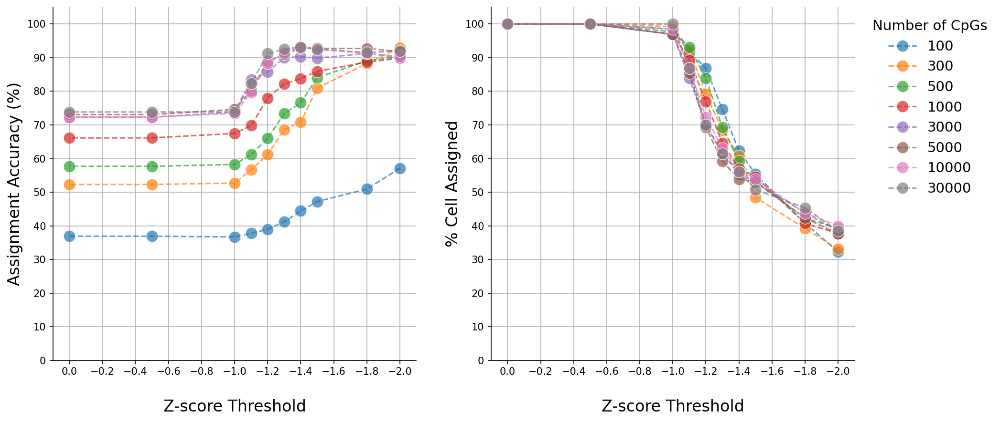

In [18]:
# Create figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=150)

# Define metrics for each subplot
metrics = [
    ('accuracy', 'Assignment Accuracy (%)', 'Assignment Accuracy vs. Z-score Threshold'),
    ('pass_percentage', '\n% Cell Assigned', '% Cell Assigned vs. Z-score Threshold')
]

for i, (y, ylabel, title) in enumerate(metrics):
    ax = axes[i]
    sns.lineplot(
        data=results_df,
        x='z_score',
        y=y,
        hue='n_cpg',
        palette='tab10',
        marker='o',
        markersize=12,
        alpha=0.7,
        linestyle='--',
        ax=ax
    )
    ax.set_xlabel('\nZ-score Threshold', fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    #ax.set_title(title, fontsize=16)
    
    ax.set_ylim(0, 105)
    ax.set_yticks(np.arange(0, 106, 10))
    ax.set_xlim(-2.1, 0.1)
    ax.set_xticks(np.arange(-2, 0.1, 0.2))
    ax.grid(True)
    ax.invert_xaxis()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# keep right legend only
axes[0].get_legend().remove()
axes[1].legend(title='Number of CpGs', fontsize=14, title_fontsize=14, loc='upper right', bbox_to_anchor=(1.4, 1.0), frameon=False)

plt.tight_layout()
plt.savefig('Accuracy_vs_zscore_and_percent_cell_assigned.pdf')
plt.show()

In [19]:
results_df.query('n_cpg == "3000"')

,n_cpg,accuracy,z_score,pass_percentage
40,3000,72.307692,0.0,100.000000
41,3000,72.307692,-0.5,100.000000
42,3000,73.809524,-1.0,96.923077
43,3000,83.486239,-1.1,83.846154
44,3000,85.714286,-1.2,70.000000
45,3000,90.000000,-1.3,61.538462
46,3000,90.277778,-1.4,55.384615
47,3000,89.855072,-1.5,53.076923
48,3000,91.228070,-1.8,43.846154
49,3000,90.000000,-2.0,38.461538


# Compare mapping to ChromHMM open states
- Process large reference data is time consuming, so we test if smaller but biological relevant regions is sufficent
- We use the ChromHMM annotated open states and intersect with the reference data
- See Vu et al. 2023 https://doi.org/10.1186/s13059-023-02994-x
- See *processing_summary.txt* for processing time after running *RETrace2/modules/infer_celltype/calculate_pd_matrix_batched.py*

In [20]:
# Manaul add results for plotting
states_df = pd.DataFrame({'Name':['Whole Genome', 'ChromHMM\nOpen States', 'ChromHMM\nPromoter+Enhancer'],
 'Region':['no_filter', 'ChromHMM_open', 'ChromHMM_mTSS_mEnhA_mEnhWk_mBivProm'],
 'Accuracy':[92, 85.86, 85.71],
 'Processing_Time_Hr':[3.74, 2.11, 0.9] 
 })

states_df

,Name,Region,Accuracy,Processing_Time_Hr
0,Whole Genome,no_filter,92.00,3.74
1,ChromHMM\nOpen States,ChromHMM_open,85.86,2.11
2,ChromHMM\nPromoter+Enhancer,ChromHMM_mTSS_mEnhA_mEnhWk_mBivProm,85.71,0.90


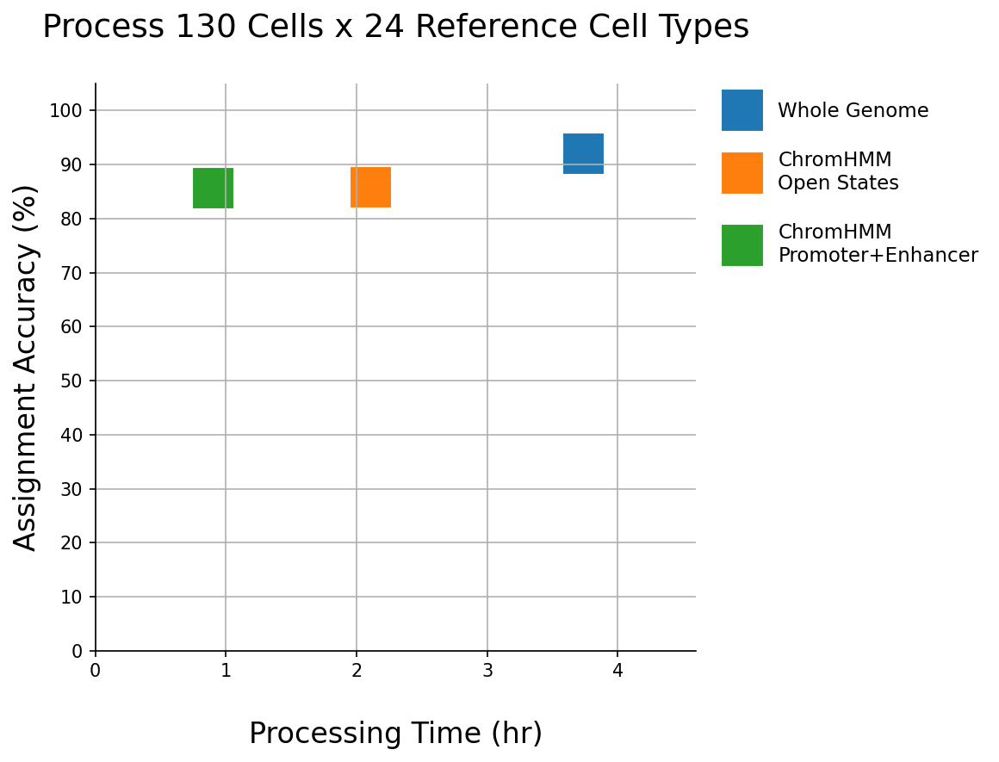

In [21]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=150)

sns.scatterplot(
    data=states_df,
    x='Processing_Time_Hr',
    y='Accuracy',
    hue='Name',
    palette='tab10',  
    s=600,
    marker='s',
    ax=ax
)

ax.set_xlabel('\nProcessing Time (hr)', fontsize=16)
ax.set_ylabel('Assignment Accuracy (%)', fontsize=16)
ax.set_title(f'Process 130 Cells x 24 Reference Cell Types\n', fontsize=18)
ax.set_xlim(0, 4.6)
ax.set_ylim(0, 105)
ax.set_yticks(np.arange(0, 106, 10))
ax.grid(True)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(title='', fontsize=11, loc='upper right', labelspacing=1.5, bbox_to_anchor=(1.5, 1.0), frameon=False)


plt.tight_layout()
plt.savefig('ChromHMM_Processing_Time.pdf', bbox_inches='tight')

plt.show()

# Plot N Shared Sites

In [22]:
# Load shared sites matrix
shared_sites_file = '/home/tcheng/Projects/RETrace/Methylation_ref/Test_data/Liu2023_Brain/2_calc_pd_matrix/test_pd_matrix_intersect_retrace2_ChromHMM_mTSS_mEnhA_mEnhWk_mBivProm_5cells/shared_sites_matrix.csv'
shared_sites = pd.read_csv(shared_sites_file, index_col=0)
shared_sites.head()

,Brain_Astro-Epen,Brain_CB-GABA,Brain_CB-Glut,Brain_CNU-GABA,Brain_CNU-HYa-GABA,Brain_CNU-HYa-Glut,Brain_CTX-CGE-GABA,Brain_CTX-MGE-GABA,Brain_DG-IMN-Glut,Brain_HY-GABA,...,Kidney_FIB,Kidney_IC,Kidney_IMMU,Kidney_PC,Kidney_PT-S1,Kidney_PT-S1S2,Kidney_PT-S2,Kidney_PT-S3,Kidney_PT,Kidney_TAL
GSM3761935_downsampled_100,58.0,58.0,58.0,58.0,58.0,58.0,58.0,58.0,58.0,58.0,...,2.0,0.0,3.0,0.0,23.0,16.0,23.0,14.0,27.0,17.0
GSM3761935_downsampled_1000,562.0,563.0,563.0,562.0,562.0,562.0,562.0,563.0,562.0,563.0,...,27.0,2.0,46.0,16.0,256.0,181.0,245.0,191.0,304.0,198.0
GSM3761935_downsampled_10000,5457.0,5460.0,5461.0,5452.0,5454.0,5453.0,5454.0,5461.0,5453.0,5460.0,...,196.0,43.0,412.0,186.0,2182.0,1611.0,2167.0,1603.0,2651.0,1644.0
GSM3761935_downsampled_300,167.0,167.0,167.0,167.0,167.0,167.0,167.0,167.0,167.0,167.0,...,4.0,1.0,12.0,5.0,56.0,42.0,57.0,39.0,80.0,46.0
GSM3761935_downsampled_3000,1622.0,1623.0,1623.0,1622.0,1622.0,1622.0,1622.0,1623.0,1622.0,1622.0,...,56.0,13.0,116.0,53.0,664.0,480.0,663.0,484.0,811.0,508.0


In [23]:
patterns = ['100', '300', '500', '1000', '3000', '5000', '10000', '30000']
shared_sites_split_dfs = {}

for pattern in patterns:
    mask = shared_sites.index.str.contains(f'_{pattern}\\b', case=False) # use word boundary to ensure exact match
    shared_sites_split_dfs[pattern] = shared_sites[mask]

In [24]:
# Apply to all split DataFrames
shared_sites_split_dfs_renamed = {}
for k_value, sub_df in shared_sites_split_dfs.items():
    shared_sites_split_dfs_renamed[k_value] = rename_index_with_metadata(sub_df, metadata)

In [25]:
# Select the brain reference 1-24 columns 
for n_cpg, df in shared_sites_split_dfs_renamed.items():
    shared_sites_split_dfs_renamed[n_cpg] = df.iloc[:, :24]

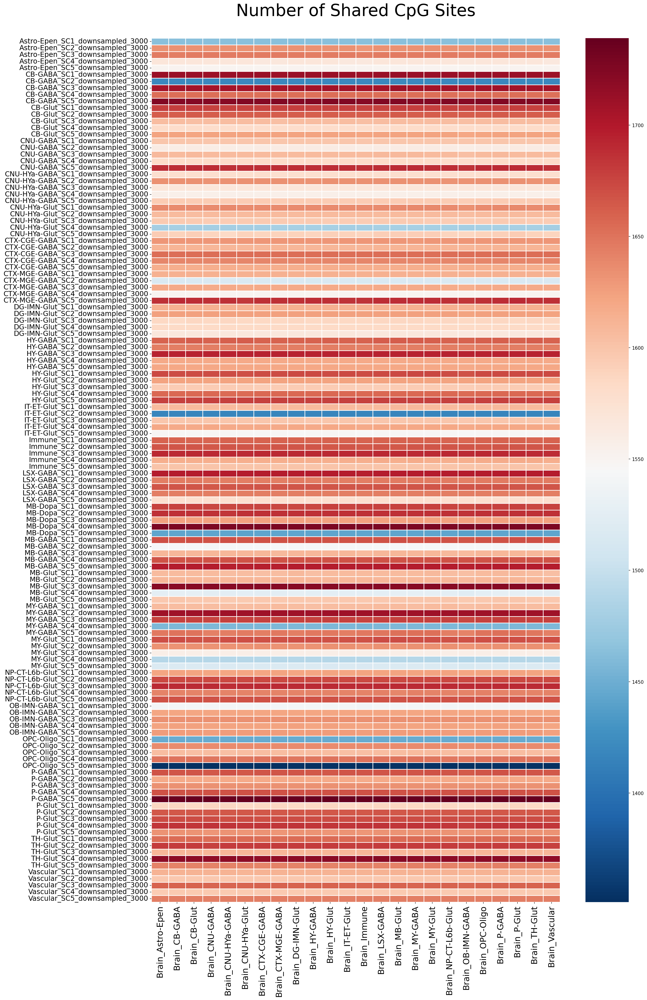

In [26]:
# Plot heatmaps 
plt.figure(figsize=(20, 30), dpi=150)
sns.heatmap(shared_sites_split_dfs_renamed['3000'], cmap='RdBu_r', linewidths=0.5, yticklabels=True)
plt.title('Number of Shared CpG Sites\n', fontsize=36)

plt.xticks(fontsize=18)
plt.yticks(fontsize=15)
plt.tight_layout()